### Import Packages

In [23]:
import open3d as o3d
import cv2
import numpy as np

### Mount the Drive

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### PCD File

In [2]:
dataset_path = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_bo
cloud = o3d.io.read_point_cloud(dataset_path) # Read the point cloud
#o3d.visualization.draw_plotly([cloud])

### Load the images

In [19]:
im1 = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_1_1.png"
im2 = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_1_2.png"
im3 = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_1_3.png"
im4 = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_1_4.png"
im5 = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_1_5.png"


In [20]:
img1=cv2.imread(im1)
img2=cv2.imread(im2)
img3=cv2.imread(im3)
img4=cv2.imread(im4)
img5=cv2.imread(im5)
images = [img1, img2, img3,img4,img5]


In [ ]:
#o3d.visualization.draw_plotly([cloud])

### For each set of RGB-D images from different camera views of the same object pose, match keypoints using ASIFT 

In [9]:
from google.colab.patches import cv2_imshow

In [27]:
def asift(images):
    # Define parameters for ASIFT keypoints
    sigma_min = 0.8
    sigma_step = 1.3
    sigma_max = 10.0
    n_scales = 30
    n_octaves = 3

    # Create a brute-force matcher object
    matcher = cv2.BFMatcher_create(cv2.NORM_HAMMING, crossCheck=True)

    # Compute ASIFT keypoints and descriptors for each image
    keypoints = []
    descriptors = []
    for img in images:
        detector = cv2.AKAZE_create(descriptor_type=cv2.AKAZE_DESCRIPTOR_MLDB_UPRIGHT,
                                    threshold=0.0001, nOctaves=n_octaves, nOctaveLayers=n_scales)
        kp = detector.detect(img)
        kp, desc = detector.compute(img, kp)
        keypoints.append(kp)
        descriptors.append(desc)

    # Match keypoints and compute homography for each pair of images
    homographies = []
    for i in range(len(images)):
        for j in range(i+1, len(images)):
            matches = matcher.match(descriptors[i], descriptors[j])
            matches = sorted(matches, key=lambda x: x.distance)[:20]

            img_matches = cv2.drawMatches(images[i], keypoints[i], images[j], keypoints[j], matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            print(f"Matches {i}-{j}")

            cv2_imshow( img_matches)

            src_pts = np.float32([keypoints[i][m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
            dst_pts = np.float32([keypoints[j][m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

            H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            homographies.append(H)

    cv2.waitKey(0)
    cv2.destroyAllWindows()

    return homographies


Matches 0-1


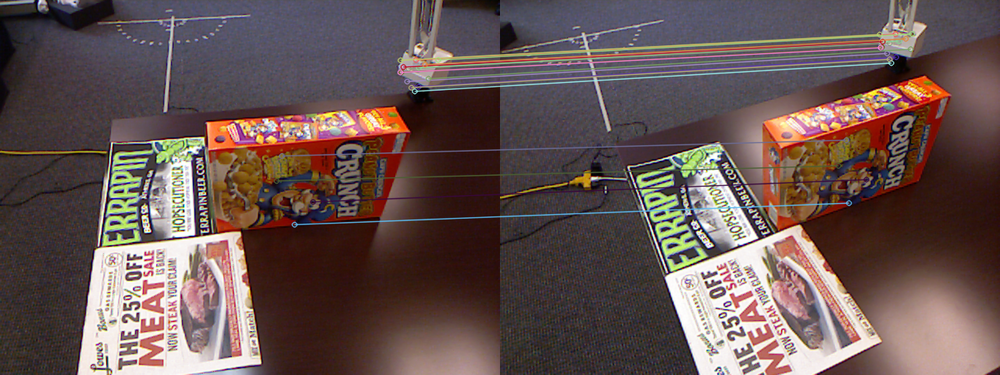

Matches 0-2


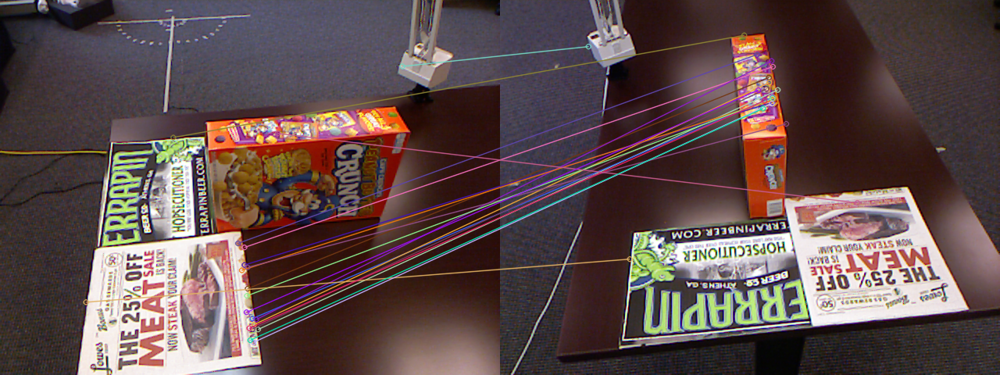

Matches 0-3


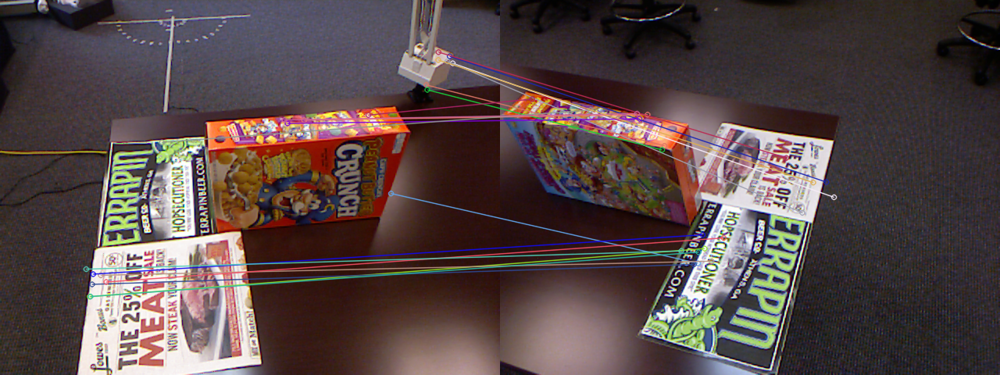

Matches 0-4


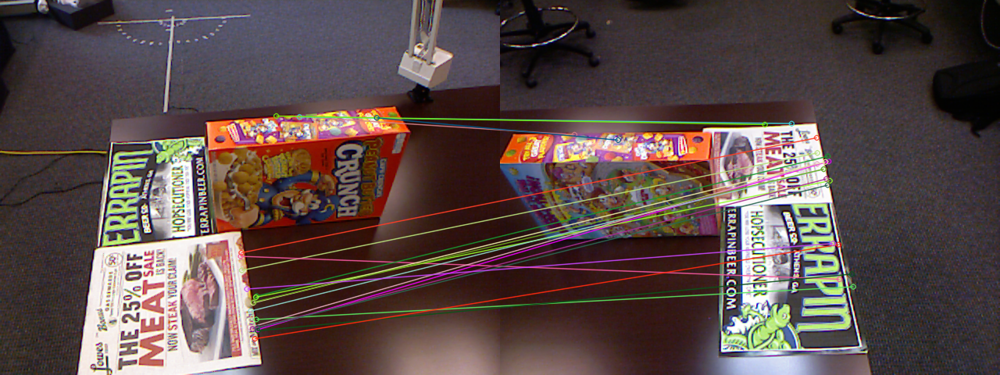

Matches 1-2


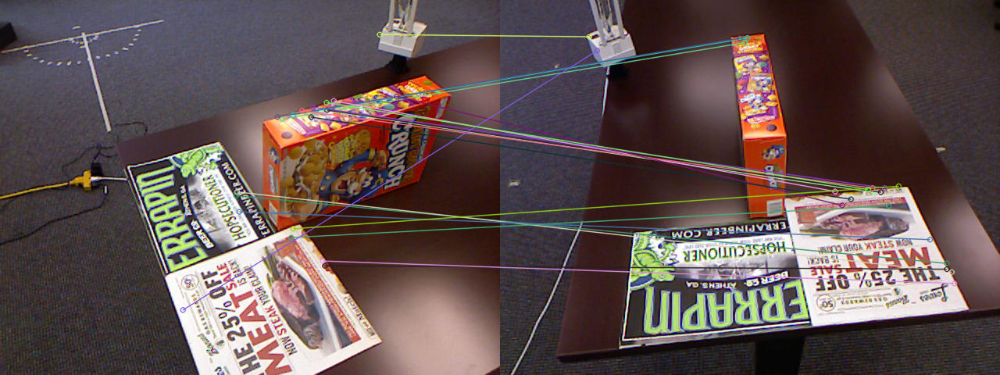

Matches 1-3


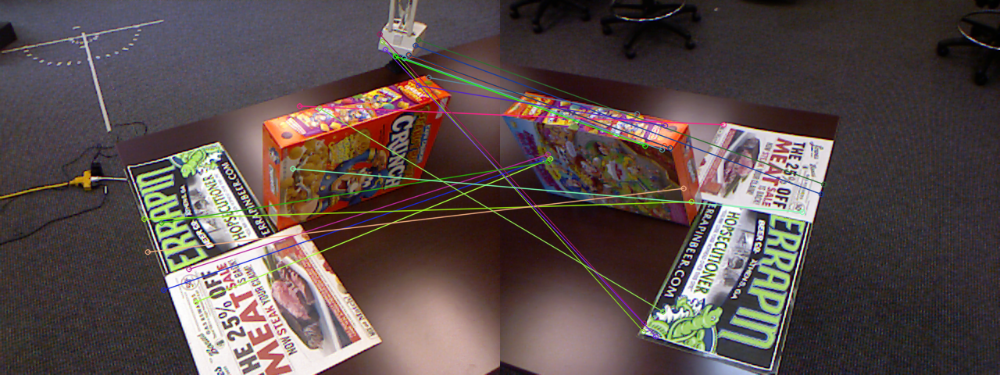

Matches 1-4


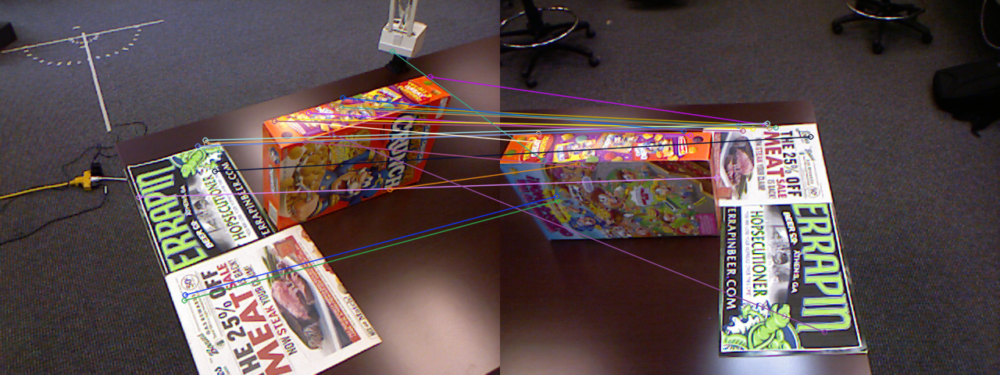

Matches 2-3


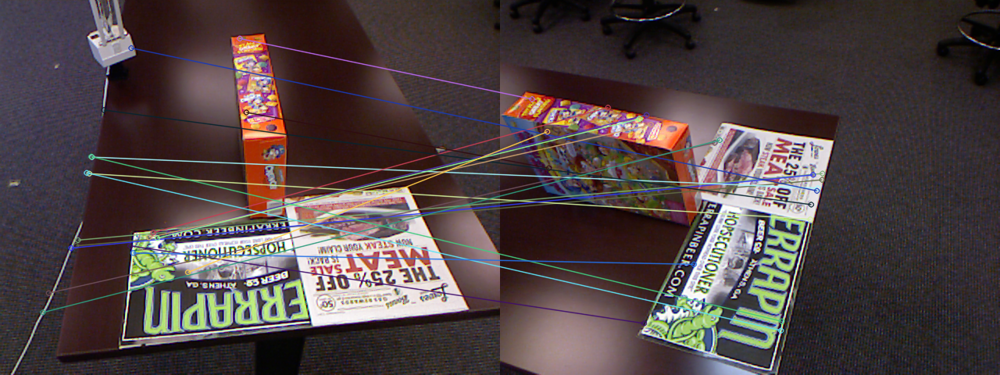

Matches 2-4


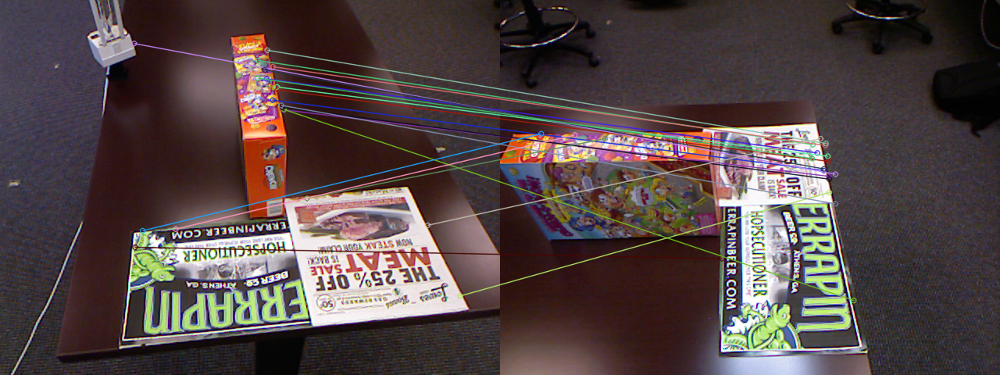

Matches 3-4


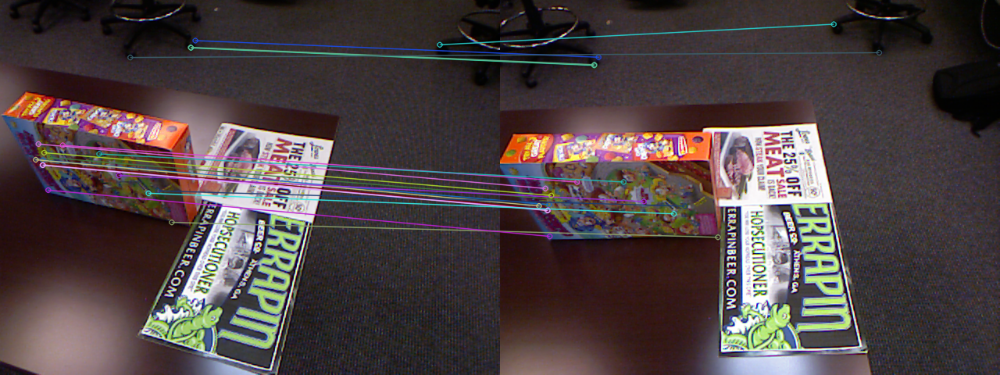

[array([[-1.45091836e+00, -4.57316059e-01,  6.49533359e+02],
       [-1.01573494e-01, -3.43198408e-01,  6.67933218e+01],
       [-2.32241305e-03, -9.74485926e-04,  1.00000000e+00]]), array([[-9.08883460e-01, -1.16170855e-01,  3.45765659e+02],
       [-3.28120019e-01, -4.51838663e-02,  1.26078440e+02],
       [-2.63949097e-03, -3.27280076e-04,  1.00000000e+00]]), array([[ 1.73517918e+00,  1.17929484e+00, -3.85622737e+02],
       [ 9.20357861e-01,  7.22752478e-01, -9.24136023e+01],
       [ 4.68529215e-03, -1.86768089e-03,  1.00000000e+00]]), array([[-9.51459589e-01, -7.67343167e-02,  3.94830128e+02],
       [-3.75885794e-01, -1.53738226e-03,  1.52229724e+02],
       [-2.38922047e-03, -2.28067381e-04,  1.00000000e+00]]), array([[-1.04434213e+00, -7.48646970e-01,  4.90164987e+02],
       [-5.38894817e-01, -3.96896225e-01,  2.54673904e+02],
       [-2.14414742e-03, -1.49811613e-03,  1.00000000e+00]]), array([[-8.82722793e-02, -1.09591296e-01,  4.12120665e+01],
       [-1.06545553e-01, -2.9

In [28]:
homographies = asift(images)
print(homographies)